In [10]:
import pandas as pd

airports = pd.read_csv("/home/niraj/Downloads/airports.dat",header=None,dtype=str)

In [11]:
airports.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,1,Goroka Airport,Goroka,Papua New Guinea,GKA,AYGA,-6.081689834590001,145.391998291,5282,10,U,Pacific/Port_Moresby,airport,OurAirports
1,2,Madang Airport,Madang,Papua New Guinea,MAG,AYMD,-5.20707988739,145.789001465,20,10,U,Pacific/Port_Moresby,airport,OurAirports
2,3,Mount Hagen Kagamuga Airport,Mount Hagen,Papua New Guinea,HGU,AYMH,-5.826789855957031,144.29600524902344,5388,10,U,Pacific/Port_Moresby,airport,OurAirports
3,4,Nadzab Airport,Nadzab,Papua New Guinea,LAE,AYNZ,-6.569803,146.725977,239,10,U,Pacific/Port_Moresby,airport,OurAirports
4,5,Port Moresby Jacksons International Airport,Port Moresby,Papua New Guinea,POM,AYPY,-9.443380355834961,147.22000122070312,146,10,U,Pacific/Port_Moresby,airport,OurAirports


In [13]:
airports.columns=['id','name','city','country','code','icao','latitude','longitude','altitude','offset','dst','timezone','12','13']


In [17]:
airports = airports.drop('12',axis=1)
airports = airports.drop('13',axis=1)

In [21]:
airports.head()

,id,name,city,country,code,icao,latitude,longitude,altitude,offset,dst,timezone
0,1,Goroka Airport,Goroka,Papua New Guinea,GKA,AYGA,-6.081689834590001,145.391998291,5282,10,U,Pacific/Port_Moresby
1,2,Madang Airport,Madang,Papua New Guinea,MAG,AYMD,-5.20707988739,145.789001465,20,10,U,Pacific/Port_Moresby
2,3,Mount Hagen Kagamuga Airport,Mount Hagen,Papua New Guinea,HGU,AYMH,-5.826789855957031,144.29600524902344,5388,10,U,Pacific/Port_Moresby
3,4,Nadzab Airport,Nadzab,Papua New Guinea,LAE,AYNZ,-6.569803,146.725977,239,10,U,Pacific/Port_Moresby
4,5,Port Moresby Jacksons International Airport,Port Moresby,Papua New Guinea,POM,AYPY,-9.443380355834961,147.22000122070312,146,10,U,Pacific/Port_Moresby


In [19]:
airlines=pd.read_csv("/home/niraj/Downloads/airlines.dat",header=None,dtype=str)
airlines.head()

,0,1,2,3,4,5,6,7
0,-1,Unknown,\N,-,NaN,\N,\N,Y
1,1,Private flight,\N,-,NaN,NaN,NaN,Y
2,2,135 Airways,\N,NaN,GNL,GENERAL,United States,N
3,3,1Time Airline,\N,1T,RNX,NEXTIME,South Africa,Y
4,4,2 Sqn No 1 Elementary Flying Training School,\N,NaN,WYT,NaN,United Kingdom,N


In [20]:
airlines.columns=['id','name','alias','iata','icao','callsign','country','active']

In [22]:
airlines.head()

,id,name,alias,iata,icao,callsign,country,active
0,-1,Unknown,\N,-,NaN,\N,\N,Y
1,1,Private flight,\N,-,NaN,NaN,NaN,Y
2,2,135 Airways,\N,NaN,GNL,GENERAL,United States,N
3,3,1Time Airline,\N,1T,RNX,NEXTIME,South Africa,Y
4,4,2 Sqn No 1 Elementary Flying Training School,\N,NaN,WYT,NaN,United Kingdom,N


In [28]:
routes = pd.read_csv('/home/niraj/Downloads/routes.dat',header=None,dtype=str)

In [29]:
routes.head()

,0,1,2,3,4,5,6,7,8
0,2B,410,AER,2965,KZN,2990,NaN,0,CR2
1,2B,410,ASF,2966,KZN,2990,NaN,0,CR2
2,2B,410,ASF,2966,MRV,2962,NaN,0,CR2
3,2B,410,CEK,2968,KZN,2990,NaN,0,CR2
4,2B,410,CEK,2968,OVB,4078,NaN,0,CR2


In [30]:
routes.columns=['airline','airline_id','source','source_id','dest','dest_id','codeshare','stops','equipment']

In [31]:
routes.head()

,airline,airline_id,source,source_id,dest,dest_id,codeshare,stops,equipment
0,2B,410,AER,2965,KZN,2990,NaN,0,CR2
1,2B,410,ASF,2966,KZN,2990,NaN,0,CR2
2,2B,410,ASF,2966,MRV,2962,NaN,0,CR2
3,2B,410,CEK,2968,KZN,2990,NaN,0,CR2
4,2B,410,CEK,2968,OVB,4078,NaN,0,CR2


In [45]:
routes.groupby(['airline_id'])['airline'].count()

airline_id
10         4
1006     118
1008       4
10121     25
10122     48
10128     13
1034      14
1048       4
1057      43
106        2
10646    102
10650      4
1066      75
10675     10
1073      38
10737      8
10739     10
10741     98
10758     14
10765     39
10776      6
10800     10
109        2
10912     15
10955     20
1109       8
116        4
1173      36
11741     24
11763     16
        ... 
8359      18
837      226
8463      32
8576      18
8745     488
879       66
8809       6
881        9
882       34
896       10
897       34
90       158
9082      50
921      126
9531      34
9541      54
96       222
9620       2
9666      12
970       29
9764      32
9784       6
9809      22
9810      26
9818      44
9828      62
9829      10
995       32
998        8
\N       479
Name: airline, dtype: int64

In [46]:
routes = routes[routes["airline_id"] != "\\N"]

In [48]:
import math

def haversine(lon1,lat1,lon2,lat2):
    lon1,lat1,lon2,lat2=[float(lon1),float(lat1),float(lon2),float(lat2)]
    
    lon1,lat1,lon2,lat2=map(math.radians,[lon1,lat1,lon2,lat2])
    
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    
    a = math.sin(dlat/2)**2 + math.cos(lat1) * math.cos(lat2) * math.sin(dlon/2)**2
    
    c = 2 * math.asin(math.sqrt(a))
    
    km = 6367 * c
    
    return km

In [51]:
def calc_dist(row):
    dist=0
    
    try:
        source = airports[airports["id"] == row["source_id"]].iloc[0]
        dest = airports[airports["id"]==row["dest_id"]].iloc[0]
        
        dist=haversine(dest["longitude"],dest["latitude"],source["longitude"],source["latitude"])
        
    except(ValueError,IndexError):
        pass
    
    return dist

In [52]:
route_lengths=routes.apply(calc_dist,axis=1)

(array([  2.31160000e+04,   1.97260000e+04,   9.94300000e+03,
          5.29800000e+03,   2.59000000e+03,   1.06300000e+03,
          8.39000000e+02,   1.01700000e+03,   9.12000000e+02,
          7.71000000e+02,   6.49000000e+02,   5.53000000e+02,
          2.47000000e+02,   2.32000000e+02,   1.46000000e+02,
          4.40000000e+01,   3.20000000e+01,   2.00000000e+00,
          0.00000000e+00,   4.00000000e+00]),
 array([     0.        ,    803.60790186,   1607.21580372,   2410.82370558,
          3214.43160744,   4018.0395093 ,   4821.64741116,   5625.25531302,
          6428.86321489,   7232.47111675,   8036.07901861,   8839.68692047,
          9643.29482233,  10446.90272419,  11250.51062605,  12054.11852791,
         12857.72642977,  13661.33433163,  14464.94223349,  15268.55013535,
         16072.15803721]),
 <a list of 20 Patch objects>)

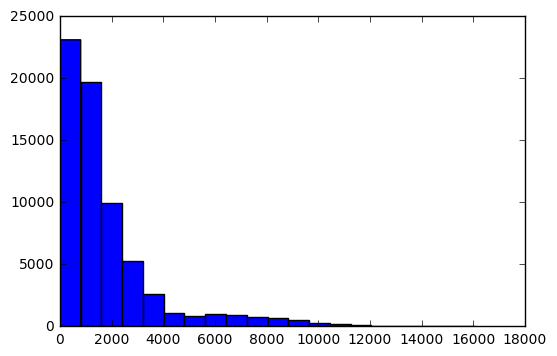

In [53]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.hist(route_lengths,bins=20)

/home/niraj/anaconda3/lib/python3.5/site-packages/statsmodels/nonparametric/kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


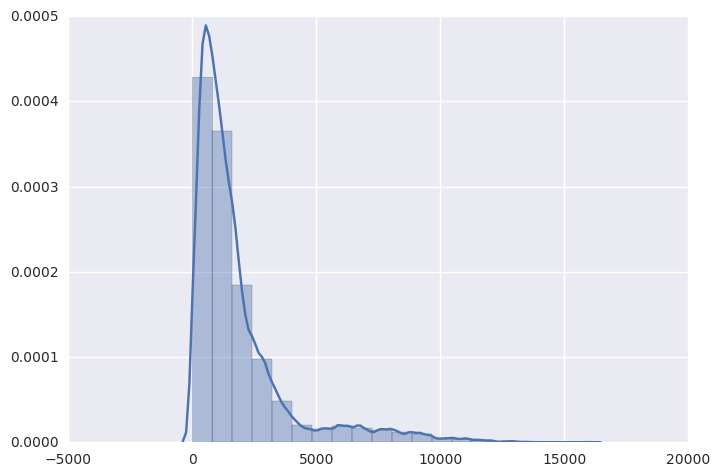

In [54]:
import seaborn as sns
sns.distplot(route_lengths,bins=20)

In [57]:
import numpy as np

route_length_df=pd.DataFrame({"length":route_lengths,"id":routes["airline_id"]})

airline_route_lengths=route_length_df.groupby("id").aggregate(np.mean)

airline_route_lengths=airline_route_lengths.sort_values(by="length",ascending=False)

In [60]:
def lookup_name(row):
      
    try:
        name=airlines["name"][airlines["id"]==row["id"]].iloc[0]
    
    except (ValueError,IndexError):
        name=""
        
    return name

airline_route_lengths["id"]=airline_route_lengths.index.copy()

airline_route_lengths["name"]=airline_route_lengths.apply(lookup_name,axis=1)

airline_route_lengths.index=range(airline_route_lengths.shape[0])


In [63]:
import numpy as np
from bokeh.io import output_notebook
from bokeh.charts import Bar,show

output_notebook()
p=Bar(airline_route_lengths,'name',values='length',title="Average airline route length",legend=None)
show(p)

Loading BokehJS ...

In [64]:
long_routes=len([k for k in route_lengths if k > 10000])/len(route_lengths)
medium_routes=len([k for k in route_lengths if k < 10000 and k > 2000])/ len(route_lengths)
short_routes=len([k for k in route_lengths if k < 2000])/len(route_lengths)

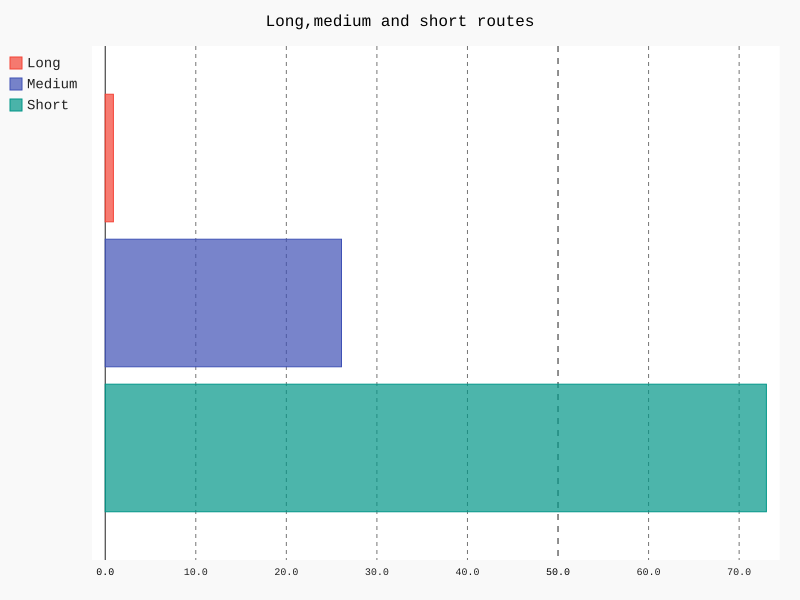

In [71]:
import pygal
from IPython.display import SVG

chart = pygal.HorizontalBar()
chart.title='Long,medium and short routes'
chart.add('Long',long_routes*100)
chart.add('Medium',medium_routes*100)
chart.add('Short',short_routes*100)
chart.render_to_file('routes.svg')
SVG(filename='routes.svg')

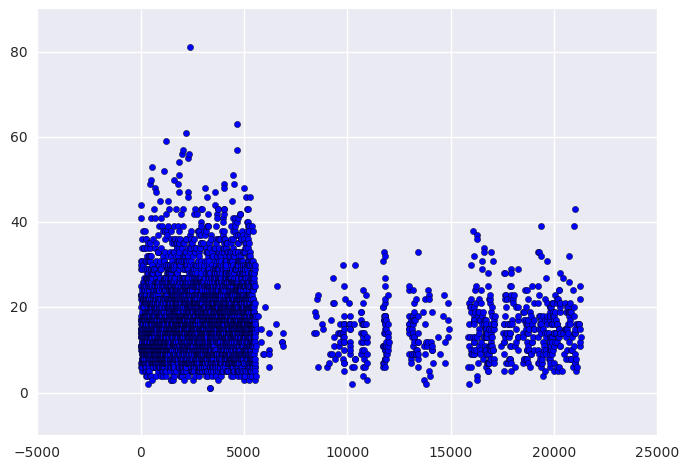

In [68]:
name_lengths=airlines['name'].apply(lambda x : len(str(x)))
plt.scatter(airlines['id'].astype(int),name_lengths)

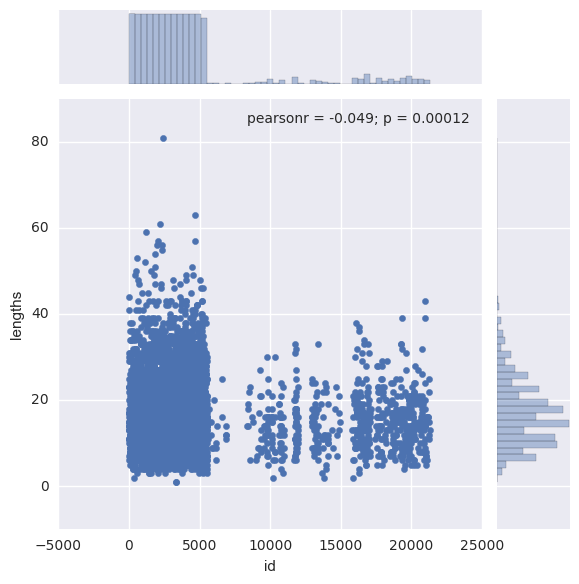

In [70]:
data=pd.DataFrame({"lengths":name_lengths,"id":airlines["id"].astype(int)})

sns.jointplot(x="id",y="lengths",data=data)

In [75]:
from mpl_toolkits.basemap import Basemap

ImportError: No module named 'mpl_toolkits.basemap'

In [74]:
import folium

In [78]:
airports_map =folium.Map(location=[30,0],zoom_start=2)

for name,row in airports.iterrows():
    if row["name"] != 'South Pole Station':
        airports_map.circle_marker(location=[row["latitude"],row["longitude"]],popup=row['name'])
        
airports_map.create_map("airports.html")
airports_map

/home/niraj/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:5: FutureWarning: circle_marker is deprecated. Use add_children(CircleMarker) instead
/home/niraj/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:7: FutureWarning: Map.create_map is deprecated. Use Map.save instead


In [82]:
weights={}

added_keys=[]

for name,row in routes.iterrows():
    source = row['source_id']
    dest = row['dest_id']
    
    key='{0}_{1}'.format(source,dest)
    
    if key in weights:
        weights[key] += 1
    elif key in added_keys:
        weights[key] = 2
    else:
        added_keys.append(key)
        

In [86]:
import networkx as nx
graph = nx.Graph()

nodes =set()

for k,weight in weights.items():
    try:
        source,dest = k.split("_")
        source,dest = [int(source),int(dest)]
        
        if source not in nodes:
            graph.add_node(source)
        
        if dest not in nodes:
            graph.add_node(dest)
            
        nodes.add(source)
        nodes.add(dest)
        
        graph.add_edge(source,dest,weight=weight)
        
    except(ValueError,IndexError):
        pass
    
    

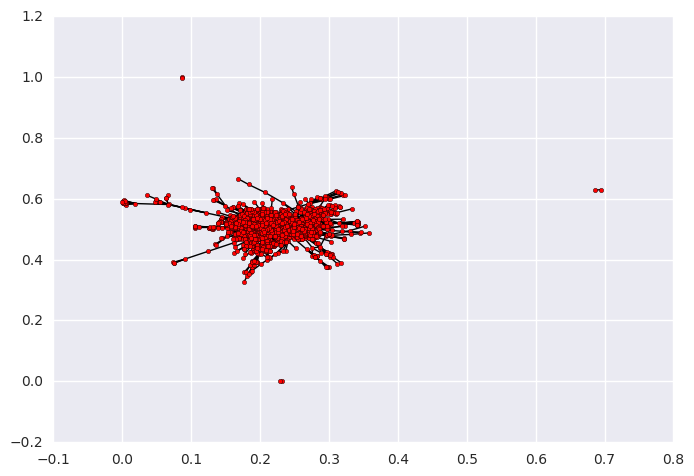

In [87]:
pos = nx.spring_layout(graph)

nx.draw_networkx_nodes(graph,pos,node_color='red',node_size=10,aplha=0.8)
nx.draw_networkx_edges(graph,pos,node_color='red',node_size=10,aplha=0.8)

plt.show()